<a href="https://colab.research.google.com/github/nicolagentili/DTM_ML_Exam/blob/main/DTM_ML_Exam_Federated_learning_for_image_classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Cross references

Overleaf

https://www.overleaf.com/project/64b3f6af0042494cf59c9a40


# **Federated learning simulation for image classification**

_Nicola Gentili's Project work for DTM Machine Learning and Data Mining exam_

Cross references
 - Overleaf: https://www.overleaf.com/project/64b3f6af0042494cf59c9a40
 - Github (copy): https://github.com/nicolagentili/DTM_ML_Exam/blob/main/DTM_ML_Exam_Federated_learning_for_image_classification.ipynb


# 1.Introduction

”Federated learning (FL) is a machine learning technique that trains an algorithm via multiple independent sessions, each using its own dataset. This approach stands in contrast to traditional centralized machine learning techniques where local datasets are merged into one training session, as well as to approaches that assume that local data samples are identically distributed. Federated learning enables multiple actors to build a common, robust machine learning model without sharing data, thus addressing critical issues such as data privacy, data security, data access rights and access to heterogeneous data.” [1]
The main objective of FL is to train machine learning algorithms avoiding to keep all data together in the same system. Some key aspects of FL are:
* the distribution of heterogeneous training datasets in multiple different nodes: the local datasets are typically heterogeneous and their sizes may span several orders of magnitude;
* the distributed computation for the training: different clients are involved in federated learning and can have different characteristics, clients may be subject to failures, can be unreachable;
* the aggregation policies.

A literature research made on Scopus at July 2023 with the query ( ”federated learning” OR ”federated machine learning” ) only in the title of the papers shows more than 5.000 papers. The first paper has been published in 2005
but the interest on the topic raise rapidly from the 2019 2. It could be interesting to understand if there are relationship between the interests on FL and the Covid-19 pandemic. Rieke et al. [2] discussed ”The future of digital health with federated learning” by exploring leverages, topologies and architectures 3, algorithms, and impact of FL in health for different stakeholders:
* Clinicians: ML-based systems, particularly those trained in a federated fashion, can enhance clinicians’ expertise by incorporating expert knowledge from different institutions, leading to more consistent and unbiased diagnoses, although it requires upfront efforts to establish common data standards and protocols.
* Patients: Global implementation of federated learning ensures quality clinical decisions for all patients, regardless of location, benefiting remote areas and rare diseases while maintaining data privacy.
* Hospitals: Hospitals and practices retain full control of patient data, minimizing the risk of misuse. However, investment in on-premise computing or privatecloud services and adherence to standardized data formats is needed for seamless ML model training and evaluation. Even small institutions can participate and benefit from collective models.
* Researchers and AI developers: Researchers and AI developers gain access to extensive real-world data, benefiting smaller labs and start-ups. This allows them to focus on clinical needs and technical challenges instead of relying on limited open data sets. However, algorithmic strategies for efficient federated training and addressing distribution shifts need to be researched. FL-based development limits the ability to investigate individual failure cases and understand model performance.
* Healthcare providers: FL is crucial for precision medicine, supporting the shift from volume-based to value-based healthcare. It enhances healthcare AI accuracy, robustness, and cost-effectiveness, leading to improved patient outcomes.
*  Manufacturers of healthcare software: FL benefits healthcare manufacturers by enabling continuous improvement of ML-based systems through aggregated learning without compromising patient data. However, implementing this may require significant infrastructure upgrades.

My interest in Federated Learning has grown thanks to my participation in two European projects aimed at verifying the effectiveness of Federated Learning in ensuring data security in healthcare, while avoiding data leaving the cyber boundaries of hospitals and research centers. The projects also focus on developing Federated Learning models for feature extraction and classification from images.

### 1.1. The TRUMPET Project [3]
The TRUMPET Project is funded by the EU’s HORIZON CL3 2021 CS 01 call under the topic 04. The goal of TRUMPET is to research and develop novel privacy
enhancement methods for Federated Learning, and to deliver a highly scalable Federated AI service platform for researchers, that will enable AI-powered studies of siloed, multi-site, cross-domain, cross border European datasets with privacy guarantees that exceed the requirements of GDPR.

### 1.2. The FLUTE Project [4]
The FLUTE Project is funded by the EU’s HORIZON HLTH 2022 IND 13 call under the topic 02. The FLUTE project will advance and scale up data-driven healthcare by developing novel methods for privacy-preserving crossborder utilization of data hubs. To demonstrate the practical use and impact of the results, the project will integrate the FLUTE platform with health data hubs located in three different countries, use their data to develop a novel federated AI toolset for diagnosis of clinically significant prostate cancer and perform a multi-national clinical validation of its efficacy, which will help to improve predictions of aggressive prostate cancer while avoiding unnecessary biopsies, thus improving the welfare of patients and significantly reducing the associated costs.

There are different frameworks that aim to support FL with different approaches, the following list presents a not exhaustive set of FL framework.
* NVFlare [5]
* TensorFlow Federated [6]
* PySyft [7]
* Flower [8]
* LEAF [9]
* FATE [10]
* FedML [11]

The objective is to simulate a FL algorithm to classify images and evaluate its results. In this work I have just scratched the surface of FL.

# 2.Material and Methods

## 2.1. The TensorFlow Federated: Machine Learning on Decentralized Data
”TensorFlow Federated (TFF) is an open-source framework for machine learning and other computations on decentralized data. TFF has been developed to facilitate open research and experimentation with Federated Learning (FL), an approach to machine learning where a shared global model is trained across many participating clients that keep their training data locally.” [6]

The building blocks provided by TFF can also be used to implement federated analytics. TFF’s interfaces are organized in two main layers:
* Federated Learning API: a set of high-level interfaces that allow developers to apply the included implementations of federated training and evaluation to their existing TensorFlow models.
* Federated Core API: a set of lower-level interfaces for concisely expressing novel federated algorithms by combining TensorFlow with distributed communication operators within a strongly-typed functional programming environment.

I tried to study NVFlare, PySyft and TensorFlow Federated Learning and I choose to use TensorFlow because it seemed nearer to my basic idea and it seemed simpler than NVFlare. I also try to understand PySyft because it is the framework that will be used in the TRUMPET and FLUTE projects, but it seemed to me a less mature rather than TensorFlow and NVFlare.

### [Colab] Environment setup

Before we start, please run the following to make sure that your environment is
correctly setup. If you don't see a greeting, please refer to the
[Installation](../install.md) guide for instructions.

In [2]:
!pip install --quiet --upgrade tensorflow-federated

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 114.4/114.4 MB 4.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.6/60.6 kB 7.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.6/104.6 kB 13.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.7/98.7 kB 12.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 558.5/558.5 kB 46.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 33.7/33.7 MB 50.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 255.8/255.8 kB 11.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 238.9/238.9 kB 23.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 365.2/365.2 kB 27.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.6/4.6 MB 42.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.4/2.4 MB 56.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.4/7.4 MB 71.2 MB/s eta 0:

In [3]:
%load_ext tensorboard

In [4]:
import collections

import numpy as np
import tensorflow as tf
import tensorflow_federated as tff
import pandas as pd


np.random.seed(0)

tff.federated_computation(lambda: 'Hello, World!')()

b'Hello, World!'

## 2.2. The celeba dataset [12]

”CelebFaces Attributes Dataset (CelebA) is a largescale face attributes dataset with more than 200K celebrity images, each with 40 attribute annotations. The images in this dataset cover large pose variations and background clutter. CelebA has large diversities, large quantities, and rich annotations, including:
* 10,177 number of identities,
* 202,599 number of face images, and
* 5 landmark locations, 40 binary attributes annotations per image.

The dataset can be employed as the training and test sets for the following computer vision tasks: face attribute recognition, face recognition, face detection, landmark (or facial part) localization, and face editing & synthesis.”

I use it to perform attribute recognition with a classification model. My prevalent test have been done on smiling attribute.

TensorFlow Federated make available a federated version of the CelebA dataset. It is derived from the LEAF repository preprocessing of the CelebA dataset. Details about LEAF were published in LEAF: A Benchmark for Federated Settings [12], and details about CelebA were published in Deep Learning Face Attributes in the Wild [13]. During LEAF preprocessing, all clients with less than 5 examples are removed; this leaves 9,343 clients. The data is available with train and test splits by clients or by examples.

Data set sizes:
* split by clients=True:
  * train: 8,408 clients, 180,429 total examples
  * test: 935 clients, 19,859 total examples
* split by clients=False:
  * train: 9,343 clients, 177,457 total examples
  * test: 9,343 clients, 22,831 total examples

It is possible to choose the split policy by passing the argument split by clients argument to the tff.simulation.datasets.celeba.load data() method.

In [5]:
celeba_train, celeba_test = tff.simulation.datasets.celeba.load_data(split_by_clients=True)

[Colab] The data sets returned by `load_data()` are instances of
`tff.simulation.ClientData`, an interface that allows you to enumerate the set
of users, to construct a `tf.data.Dataset` that represents the data of a
particular user, and to query the structure of individual elements. Here's how
you can use this interface to explore the content of the data set. Keep in mind
that while this interface allows you to iterate over clients ids, this is only a
feature of the simulation data. As you will see shortly, client identities are
not used by the federated learning framework - their only purpose is to allow
you to select subsets of the data for simulations.

In [6]:
len(celeba_train.client_ids)

8408

In [7]:
celeba_train.element_type_structure

OrderedDict([('arched_eyebrows',
              TensorSpec(shape=(), dtype=tf.bool, name=None)),
             ('attractive', TensorSpec(shape=(), dtype=tf.bool, name=None)),
             ('bags_under_eyes',
              TensorSpec(shape=(), dtype=tf.bool, name=None)),
             ('bald', TensorSpec(shape=(), dtype=tf.bool, name=None)),
             ('bangs', TensorSpec(shape=(), dtype=tf.bool, name=None)),
             ('big_lips', TensorSpec(shape=(), dtype=tf.bool, name=None)),
             ('big_nose', TensorSpec(shape=(), dtype=tf.bool, name=None)),
             ('black_hair', TensorSpec(shape=(), dtype=tf.bool, name=None)),
             ('blond_hair', TensorSpec(shape=(), dtype=tf.bool, name=None)),
             ('blurry', TensorSpec(shape=(), dtype=tf.bool, name=None)),
             ('brown_hair', TensorSpec(shape=(), dtype=tf.bool, name=None)),
             ('bushy_eyebrows',
              TensorSpec(shape=(), dtype=tf.bool, name=None)),
             ('chubby', TensorSpec(shap

In [8]:
celeba_example_dataset = celeba_train.create_tf_dataset_for_client(celeba_train.client_ids[0])

celeba_example_element = next(iter(celeba_example_dataset))

In [9]:
celeba_train.create_tf_dataset_for_client(celeba_train.client_ids[0])

<_ParallelMapDataset element_spec=OrderedDict([('arched_eyebrows', TensorSpec(shape=(), dtype=tf.bool, name=None)), ('attractive', TensorSpec(shape=(), dtype=tf.bool, name=None)), ('bags_under_eyes', TensorSpec(shape=(), dtype=tf.bool, name=None)), ('bald', TensorSpec(shape=(), dtype=tf.bool, name=None)), ('bangs', TensorSpec(shape=(), dtype=tf.bool, name=None)), ('big_lips', TensorSpec(shape=(), dtype=tf.bool, name=None)), ('big_nose', TensorSpec(shape=(), dtype=tf.bool, name=None)), ('black_hair', TensorSpec(shape=(), dtype=tf.bool, name=None)), ('blond_hair', TensorSpec(shape=(), dtype=tf.bool, name=None)), ('blurry', TensorSpec(shape=(), dtype=tf.bool, name=None)), ('brown_hair', TensorSpec(shape=(), dtype=tf.bool, name=None)), ('bushy_eyebrows', TensorSpec(shape=(), dtype=tf.bool, name=None)), ('chubby', TensorSpec(shape=(), dtype=tf.bool, name=None)), ('double_chin', TensorSpec(shape=(), dtype=tf.bool, name=None)), ('eyeglasses', TensorSpec(shape=(), dtype=tf.bool, name=None)), (

In [10]:
################################
################################
################################
################################ DA VERIFICARE
################################
################################
################################
#
#@tff.tf_computation(tff.SequenceType(tf.float32))
#def get_local_temperature_average(local_temperatures):
#  sum_and_count = (
#      local_temperatures.reduce((0.0, 0), lambda x, y: (x[0] + y, x[1] + 1)))
#  return sum_and_count[0] / tf.cast(sum_and_count[1], tf.float32)
#
#print(str(get_local_temperature_average.type_signature))
#
#
#@tff.tf_computation(tff.SequenceType(tf.int32))
#def foo(x):
#  return x.reduce(np.int32(0), lambda x, y: x + y)
#
#print(foo([1, 2, 3]))
#
#print(get_local_temperature_average([68.5, 70.3, 69.8]))
#
#@tff.tf_computation(tff.SequenceType(collections.OrderedDict([('A', tf.int32), ('B', tf.int32)])))
#def foo(ds):
#  print('element_structure = {}'.format(ds.element_spec))
#  return ds.reduce(np.int32(0), lambda total, x: total + x['A'] * x['B'])
#
#print(str(foo.type_signature))
#
#
#print(foo([{'A': 2, 'B': 3}, {'A': 4, 'B': 5}]))
#
#
#@tff.federated_computation(
#    tff.type_at_clients(tff.SequenceType(tf.float32)))
#def get_global_temperature_average(sensor_readings):
#  return tff.federated_mean(
#      tff.federated_map(get_local_temperature_average, sensor_readings))
#
#print(str(get_global_temperature_average.type_signature))
#
#
#print(get_global_temperature_average(celeba_train.create_tf_dataset_for_client(celeba_train.client_ids[0])))
#

[Colab] Here a function to manage user input.

In [11]:
def makeChoice(inputQuestiom, choices):
    conf = inputQuestiom + "\n"
    conf = conf + "──────────────────────────────────────────────────────────────────────────\n"
    for s in choices.itertuples():
        conf = conf + str(s.Index) + ' - ' + s.label + "\n"
    conf = conf + "──────────────────────────────────────────────────────────────────────────"

    minIndex = choices.index.min()
    maxIndex = choices.index.max()

    print(conf)

    cfgid = -1
    while cfgid == -1:
        cfgid = input('Please, make your choice: ')

        try:
            cfgid = int(cfgid)

            if minIndex <= cfgid <= maxIndex:
                print('Choice ' + str(cfgid) + ': ' + str(choices.loc[cfgid].label) + ' confirmed.')

                cfg = choices.loc[cfgid].label

            else:
                print("Please insert year between " + str(minIndex) + " and " + str(maxIndex) + ".")
                cfgid = -1

        except ValueError:
            print('Please insert a valid number')
            cfgid = -1

    return cfg


In [12]:
tmp = []
for i in celeba_train.element_type_structure:
  if celeba_train.element_type_structure[i].dtype == type(True):
    tmp.append(i)

In [13]:
#Qui vorrei visualizzare l'elenco dei 40 attributi e far scegliere all'utente cosa vuole tentare di classificare
attributeList = pd.DataFrame({'label': tmp})

attributeToBeClassified =  makeChoice("From which year do you want to start the analysis?", attributeList)

From which year do you want to start the analysis?
──────────────────────────────────────────────────────────────────────────
0 - arched_eyebrows
1 - attractive
2 - bags_under_eyes
3 - bald
4 - bangs
5 - big_lips
6 - big_nose
7 - black_hair
8 - blond_hair
9 - blurry
10 - brown_hair
11 - bushy_eyebrows
12 - chubby
13 - double_chin
14 - eyeglasses
15 - five_o_clock_shadow
16 - goatee
17 - gray_hair
18 - heavy_makeup
19 - high_cheekbones
20 - male
21 - mouth_slightly_open
22 - mustache
23 - narrow_eyes
24 - no_beard
25 - oval_face
26 - pale_skin
27 - pointy_nose
28 - receding_hairline
29 - rosy_cheeks
30 - sideburns
31 - smiling
32 - straight_hair
33 - wavy_hair
34 - wearing_earrings
35 - wearing_hat
36 - wearing_lipstick
37 - wearing_necklace
38 - wearing_necktie
39 - young
──────────────────────────────────────────────────────────────────────────
Please, make your choice: 31
Choice 31: smiling confirmed.


In [14]:
celeba_example_element[attributeToBeClassified].numpy()

True

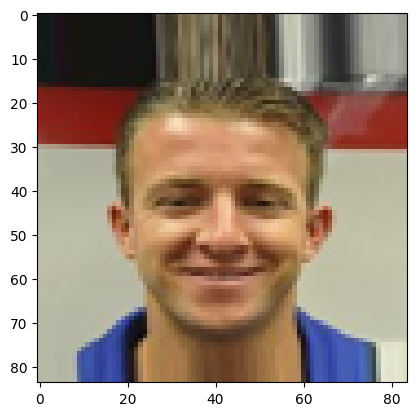

In [15]:
from matplotlib import pyplot as plt
plt.imshow(celeba_example_element['image'].numpy(), cmap='gray', aspect='equal')
plt.grid(False)
_ = plt.show()

### [Colab] Exploring heterogeneity in federated data

Federated data is typically non-[i.i.d.](https://en.wikipedia.org/wiki/Independent_and_identically_distributed_random_variables), users typically have different distributions of data depending on usage patterns. Some clients may have fewer training examples on device, suffering from data paucity locally, while some clients will have more than enough training examples. Let's explore this concept of data heterogeneity typical of a federated system with the EMNIST data we have available. It's important to note that this deep analysis of a client's data is only available to us because this is a simulation environment where all the data is available to us locally. In a real production federated environment you would not be able to inspect a single client's data.

[Colab] First, let's grab a sampling of one client's data to get a feel for the examples on one simulated device. Because the dataset we're using has been keyed by unique writer, the data of one client represents the handwriting of one person for a sample of the digits 0 through 9, simulating the unique "usage pattern" of one user.

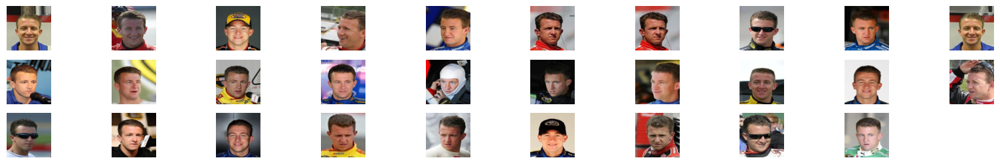

In [16]:
## Example MNIST digits for one client
figure = plt.figure(figsize=(20, 4))
j = 0

for example in celeba_example_dataset.take(40):
  plt.subplot(4, 10, j+1)
  plt.imshow(example['image'].numpy(), cmap='gray', aspect='equal')
  plt.axis('off')
  j += 1

[Colab] Now let's visualize the number of examples on each client for each attribute label. In the federated environment, the number of examples on each client can vary quite a bit, depending on user behavior.

<__array_function__ internals>:180: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


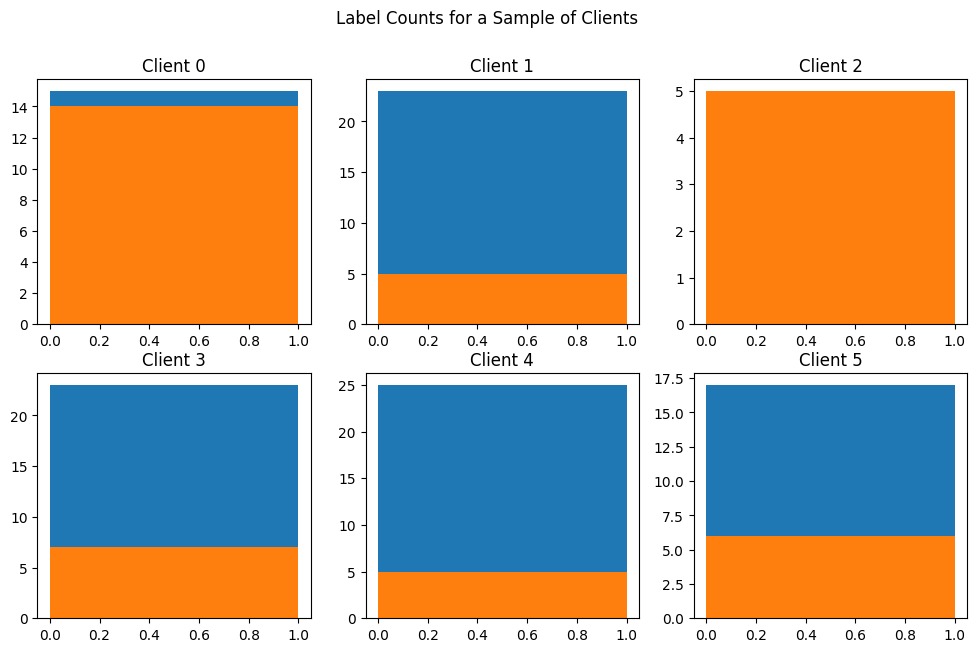

In [17]:
# Number of examples per layer for a sample of clients
f = plt.figure(figsize=(12, 7))
f.suptitle('Label Counts for a Sample of Clients')
for i in range(6):
  celeba_client_dataset = celeba_train.create_tf_dataset_for_client(celeba_train.client_ids[i])
  plot_data = collections.defaultdict(list)
  for example in celeba_client_dataset:
    # Append counts individually per label to make plots
    # more colorful instead of one color per plot.
    label = example[attributeToBeClassified].numpy()
    plot_data[label].append(label)
  plt.subplot(2, 3, i+1)
  plt.title('Client {}'.format(i))
  for j in range(2):
    plt.hist(
        plot_data[j],
        density=False,
        bins=[0, 1])

[Colab] Now let's visualize the mean image per client for each CelabA label. This code will produce the mean of each pixel value for all of the user's examples for one label. We'll see that one client's mean image for a digit will look different than another client's mean image for the same digit, due to each person's unique handwriting style. We can muse about how each local training round will nudge the model in a different direction on each client, as we're learning from that user's own unique data in that local round. Later in the tutorial we'll see how we can take each update to the model from all the clients and aggregate them together into our new global model, that has learned from each of our client's own unique data.

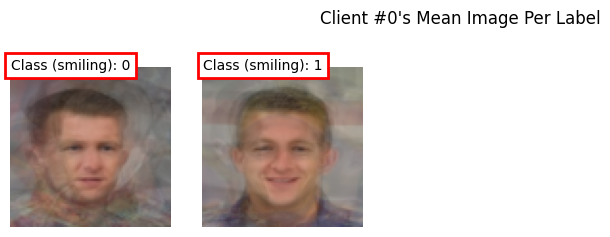

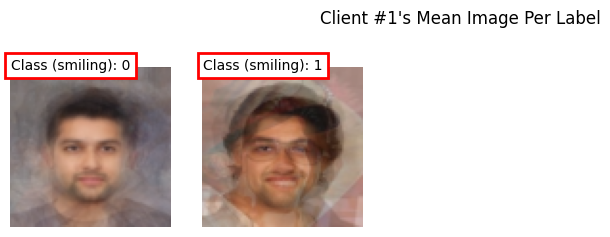

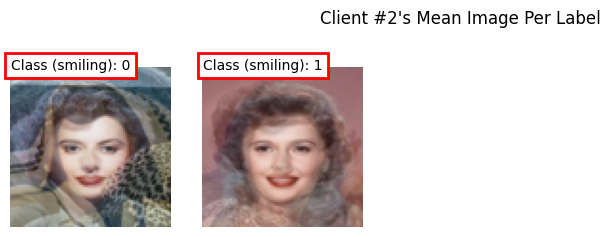

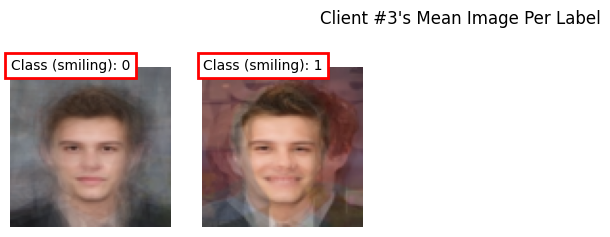

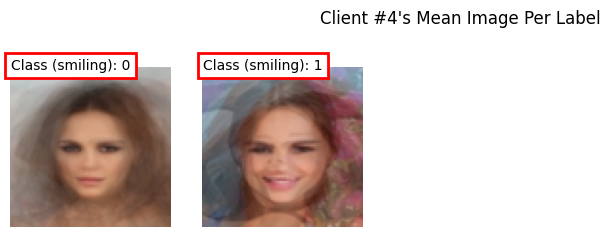

In [18]:
# Each client has different mean images, meaning each client will be nudging
# the model in their own directions locally.

for i in range(5):
  client_dataset = celeba_train.create_tf_dataset_for_client(celeba_train.client_ids[i])
  plot_data = collections.defaultdict(list)
  for example in client_dataset:
    plot_data[example[attributeToBeClassified].numpy()].append(example['image'].numpy())
  f = plt.figure(i, figsize=(12, 5))
  f.suptitle("Client #{}'s Mean Image Per Label".format(i))
  for j in range(2):
    try:
      mean_img = np.mean(plot_data[j], 0).astype(np.uint8)
      plt.subplot(2, 5, j+1)
      plt.imshow(mean_img, cmap='gray', aspect='equal')

      plt.text(0, 1, 'Class (' + attributeToBeClassified + '): ' + str(j), bbox=dict(fill=True, facecolor='white', edgecolor='red', linewidth=2))

      plt.axis('off')
    except:
      pass

[COLAB] Evaluation on feature extraction

I tried to test the functioning of the Histogram of Ordered Gradient (HOG) and Local Binary Pattern (LBP). The use HOG or LBP could help to obtain better performances. It is necessary to understand if this feature extractions techniques can be applied in the same way for different attributes or set of images and we also need to modify the network shape to use also these inputs.

The idea, not implemented in this project , is to modify the network topology to inject, together with the image, also the HOG and LBP features.

This part could be trivial from a logical point of view, but due to the complexity of the FL I had no time to deeply study and apply this part.

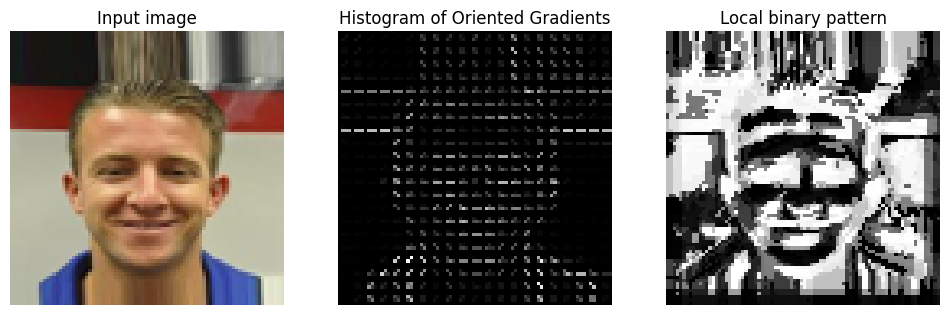

In [19]:
from skimage.feature import hog, local_binary_pattern
from skimage import data, exposure
from skimage.color import rgb2gray

image = celeba_example_element['image'].numpy()

fd, hog_image = hog(image, orientations=3, pixels_per_cell=(4, 4),
                    cells_per_block=(2, 2), visualize=True, channel_axis=-1)

lbp_image = local_binary_pattern(rgb2gray(image), P=10, R=5)

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(12, 4), sharex=True, sharey=True)

ax1.axis('off')
ax1.imshow(image, cmap=plt.cm.gray)
ax1.set_title('Input image')

# Rescale histogram for better display
hog_image_rescaled = exposure.rescale_intensity(hog_image, in_range=(0, 10))

ax2.axis('off')
ax2.imshow(hog_image, cmap=plt.cm.gray)
ax2.set_title('Histogram of Oriented Gradients')

ax3.axis('off')
ax3.imshow(lbp_image, cmap=plt.cm.gray)
ax3.set_title('Local binary pattern')
plt.show()

## 2.3. The tensorflow federaded learning


### [Colab] Preprocessing the input data

In [20]:
CELEBA_NUM_CLIENTS = 10
CELEBA_NUM_EPOCHS = 5
CELEBA_BATCH_SIZE = 20
CELEBA_SHUFFLE_BUFFER = 100
CELEBA_PREFETCH_BUFFER = 10

def celeba_preprocess(dataset):

  def celeba_batch_format_fn(element):
    """Flatten a batch `pixels` and return the features as an `OrderedDict`."""
    return collections.OrderedDict(
        #x=tf.reshape(element['image'], [-1, 21168]),
        x=tf.cast(element['image'], tf.float32)/255,
        #y=tf.reshape(element['attributeToBeClassified'], [-1, 1])
        y=tf.cast(element[attributeToBeClassified], tf.int16)
        )


  return dataset.repeat(CELEBA_NUM_EPOCHS).shuffle(CELEBA_SHUFFLE_BUFFER, seed=1).batch(
      CELEBA_BATCH_SIZE).map(celeba_batch_format_fn).prefetch(CELEBA_PREFETCH_BUFFER)


In [21]:
for e in celeba_example_dataset.take(1):
  print(tf.cast(e['image'], tf.float32)/255)
  print(e['image'].shape)

tf.Tensor(
[[[0.09019608 0.09411765 0.08627451]
  [0.07058824 0.09803922 0.09019608]
  [0.06666667 0.10588235 0.10980392]
  ...
  [0.65882355 0.6627451  0.6313726 ]
  [0.60784316 0.6156863  0.57254905]
  [0.5803922  0.58431375 0.5529412 ]]

 [[0.09019608 0.09411765 0.08627451]
  [0.07058824 0.09803922 0.09019608]
  [0.06666667 0.10588235 0.10980392]
  ...
  [0.65882355 0.6627451  0.6313726 ]
  [0.6117647  0.61960787 0.5764706 ]
  [0.59607846 0.6        0.5647059 ]]

 [[0.09019608 0.09411765 0.08627451]
  [0.07058824 0.09803922 0.09019608]
  [0.06666667 0.10588235 0.10980392]
  ...
  [0.65882355 0.6627451  0.6313726 ]
  [0.61960787 0.62352943 0.58431375]
  [0.6039216  0.6117647  0.5764706 ]]

 ...

 [[0.70980394 0.72156864 0.64705884]
  [0.70980394 0.72156864 0.64705884]
  [0.70980394 0.72156864 0.64705884]
  ...
  [0.9019608  0.9019608  0.8235294 ]
  [0.88235295 0.8980392  0.79607844]
  [0.87058824 0.87058824 0.76862746]]

 [[0.70980394 0.72156864 0.64705884]
  [0.70980394 0.72156864 0

[Colab] Let's verify this worked.

In [22]:
celeba_preprocessed_example_dataset = celeba_preprocess(celeba_example_dataset)

celeba_sample_batch = tf.nest.map_structure(lambda x: x.numpy(),
                                     next(iter(celeba_preprocessed_example_dataset)))

print(celeba_sample_batch['x'].shape)
print(celeba_sample_batch['y'].shape)
celeba_sample_batch

(20, 84, 84, 3)
(20,)


OrderedDict([('x',
              array([[[[0.29411766, 0.36078432, 0.42352942],
                       [0.29411766, 0.36078432, 0.42352942],
                       [0.29411766, 0.36078432, 0.42352942],
                       ...,
                       [0.2901961 , 0.35686275, 0.41960785],
                       [0.2901961 , 0.35686275, 0.41960785],
                       [0.2901961 , 0.35686275, 0.41960785]],
              
                      [[0.29411766, 0.36078432, 0.42352942],
                       [0.29411766, 0.36078432, 0.42352942],
                       [0.29411766, 0.36078432, 0.42352942],
                       ...,
                       [0.2901961 , 0.35686275, 0.41960785],
                       [0.2901961 , 0.35686275, 0.41960785],
                       [0.2901961 , 0.35686275, 0.41960785]],
              
                      [[0.29411766, 0.36078432, 0.42352942],
                       [0.29411766, 0.36078432, 0.42352942],
                       [0.29411766, 0.3

[Colab] We have almost all the building blocks in place to construct federated data
sets.

One of the ways to feed federated data to TFF in a simulation is simply as a
Python list, with each element of the list holding the data of an individual
user, whether as a list or as a `tf.data.Dataset`. Since we already have
an interface that provides the latter, let's use it.

Here's a simple helper function that will construct a list of datasets from the
given set of users as an input to a round of training or evaluation.

In [23]:
def celeba_make_federated_data(client_data, client_ids):
  return [
      celeba_preprocess(client_data.create_tf_dataset_for_client(x))
      for x in client_ids
  ]

[Colab] Now, how do we choose clients?

In a typical federated training scenario, we are dealing with potentially a very
large population of user devices, only a fraction of which may be available for
training at a given point in time. This is the case, for example, when the
client devices are mobile phones that participate in training only when plugged
into a power source, off a metered network, and otherwise idle.

Of course, we are in a simulation environment, and all the data is locally
available. Typically then, when running simulations, we would simply sample a
random subset of the clients to be involved in each round of training, generally
different in each round.

That said, as you can find out by studying the paper on the
[Federated Averaging](https://arxiv.org/abs/1602.05629) algorithm, achieving convergence in a system with randomly sampled
subsets of clients in each round can take a while, and it would be impractical
to have to run hundreds of rounds in this interactive tutorial.

What we'll do instead is sample the set of clients once, and
reuse the same set across rounds to speed up convergence (intentionally
over-fitting to these few user's data). We leave it as an exercise for the
reader to modify this tutorial to simulate random sampling - it is fairly easy to
do (once you do, keep in mind that getting the model to converge may take a
while).

In [24]:
celeba_sample_clients = celeba_train.client_ids[0:CELEBA_NUM_CLIENTS]

celeba_federated_train_data = celeba_make_federated_data(celeba_train, celeba_sample_clients)

print(f'Number of client datasets: {len(celeba_federated_train_data)}')
print(f'First dataset: {celeba_federated_train_data[0]}')

Number of client datasets: 10
First dataset: <_PrefetchDataset element_spec=OrderedDict([('x', TensorSpec(shape=(None, 84, 84, 3), dtype=tf.float32, name=None)), ('y', TensorSpec(shape=(None,), dtype=tf.int16, name=None))])>


### 2.3. The MobileVNet2

MobileNetV2 is a mobile architecture proposed by Sandler et al. [14], the atuthors showed that MobileNetV2 improves the state of the art performance of mobile models on multiple tasks and benchmarks as well as across a spectrum of different model sizes.

A mobile model is a compact and optimized version of a machine learning model designed for deployment on mobile devices such as smartphones, tablets, or other resourceconstrained devices. Mobile models are typically lightweight and have reduced computational and memory requirements compared to their larger counterparts, making them suitable for efficient execution on mobile hardware.

MobileVNet2 is based on an inverted residual structure where the shortcut connections are between the thin bottleneck layers. The intermediate expansion layer uses lightweight depthwise convolutions to filter features as a
source of non-linearity. In this work, MobileVNet2 is used with two purposes: (i) understand how to start from an existing model rather than start from scratch and (ii) have a model for classification more effective with respect to a basic model that is not effective on this type of dataset.

The model takes one image (3 channels, 224×224 in size) at a time as input, and outputs a vector of probabilities of size n (40, one for each attribute). The i-th element of the vector is a real number between 0 (attribute i is not present) and 1 (attribute i is present). I modified the shape of the input and the output of the model to have in input images with a different shape (84x84x3) and only 1 class equivalent to a chosen attribute. Also the output is modified to obtain only a binary class (0 or 1).

I’ve found an application that added some layers above MobileNetV2 model to improve performances:
* data augmentation layer: To argument input images to various random zoom, flip and shift inorder to increase the size of the training set.
* keras preprocess input layer: To normalize the image between pixels -1 and 1 and reshape image from shape=(218, 178, 3) to shape=(224, 244, 3) as required by MobileNetV2.
* GlobalAveragePooling2D: To flatten the top layer to feed to FCL.
* BatchNormalization and Dropout: To reduce overfitting during training.
* Optimizer, Loss Function and Metrics

Optimizer and loss are not defined in this step, because it is necessary to setup the federated learning architecture, we’ll see in the following sections.

The following code shows the function that compose the final model.

In [25]:
#Now lets a build the model

from tensorflow.keras.layers import Dense, BatchNormalization, Dropout
from tensorflow.keras.models import Model

def celeba_create_keras_model_MobileVNet2(num_features = 1):

  #Download the MobileNetV2 Model
  base_model = tf.keras.applications.mobilenet_v2.MobileNetV2(input_shape=(84,84,3), weights=None, include_top=False, pooling='avg')

  #Create the data_augmentation layer
  data_augmentation = tf.keras.Sequential([
    tf.keras.layers.experimental.preprocessing.RandomFlip('horizontal'),
    tf.keras.layers.experimental.preprocessing.RandomTranslation(0.2, 0.2, fill_mode='nearest'),
    tf.keras.layers.experimental.preprocessing.RandomZoom(0.2, fill_mode='nearest'),
    tf.keras.layers.experimental.preprocessing.RandomRotation(0.2),
  ])

  #Now lets put it all together
  preprocess_input = tf.keras.applications.mobilenet_v2.preprocess_input

  inputs = tf.keras.Input(shape=(224,224,3))
  x = data_augmentation(inputs)
  x = preprocess_input(x)
  x = base_model.output
  x = Dense(1536, activation='relu')(x)
  x = BatchNormalization()(x)
  x = Dropout(0.3)(x)

  output = Dense(num_features, activation='sigmoid')(x)

  model = Model(inputs=base_model.input, outputs=output)

  #model.compile(optimizer='adadelta',loss='cosine_similarity', metrics=['binary_accuracy'])

  return model

In [26]:
celeba_model = celeba_create_keras_model_MobileVNet2(1)

In [27]:
celeba_model.input_shape

(None, 84, 84, 3)

[Colab] **Note:** we do not compile the model yet. The loss, metrics, and optimizers are introduced later.

In order to use any model with TFF, it needs to be wrapped in an instance of the
`tff.learning.models.VariableModel` interface, which exposes methods to stamp the model's
forward pass, metadata properties, etc., similarly to Keras, but also introduces
additional elements, such as ways to control the process of computing federated
metrics. Let's not worry about this for now; if you have a Keras model like the
one we've just defined above, you can have TFF wrap it for you by invoking
`tff.learning.models.from_keras_model`, passing the model and a sample data batch as
arguments, as shown below.

In [28]:
def celeba_model_fn():
  keras_model = celeba_create_keras_model_MobileVNet2(1)
  return tff.learning.models.from_keras_model(
      keras_model,
      input_spec=celeba_preprocessed_example_dataset.element_spec,
      loss=tf.keras.losses.MeanAbsoluteError(),
      metrics=[tf.keras.metrics.BinaryAccuracy()]
      )

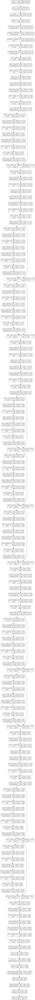

In [29]:
from keras.utils.vis_utils import plot_model
plot_model(celeba_model, to_file='model_plot.png', show_shapes=True, show_layer_names=True, dpi=150)

## 2.4. The Colab Environment


## 2.5. Putting all together (Training)


### [Colab] Training the model on federated data

Now that we have a model wrapped as `tff.learning.models.VariableModel` for use with TFF, we
can let TFF construct a Federated Averaging algorithm by invoking the helper
function `tff.learning.algorithms.build_weighted_fed_avg`, as follows.

Keep in mind that the argument needs to be a constructor (such as `model_fn`
above), not an already-constructed instance, so that the construction of your
model can happen in a context controlled by TFF (if you're curious about the
reasons for this, we encourage you to read the follow-up tutorial on
[custom algorithms](custom_federated_algorithms_1.ipynb)).

One critical note on the Federated Averaging algorithm below, there are **2**
optimizers: a _client_optimizer_ and a _server_optimizer_. The
_client_optimizer_ is only used to compute local model updates on each client.
The _server_optimizer_ applies the averaged update to the global model at the
server. In particular, this means that the choice of optimizer and learning rate
used may need to be different than the ones you have used to train the model on
a standard i.i.d. dataset. We recommend starting with regular SGD, possibly with
a smaller learning rate than usual. The learning rate we use has not been
carefully tuned, feel free to experiment.

In [30]:
celeba_training_process = tff.learning.algorithms.build_weighted_fed_avg(
    celeba_model_fn,
    client_optimizer_fn=lambda: tf.keras.optimizers.Adadelta(learning_rate=0.02),
    server_optimizer_fn=lambda: tf.keras.optimizers.Adadelta(learning_rate=0.5)
    )

Instructions for updating:
Colocations handled automatically by placer.
/usr/local/lib/python3.10/dist-packages/tensorflow_federated/python/learning/models/keras_utils.py:203: UserWarning: Batch Normalization contains non-trainable variables that won't be updated during the training. Consider using Group Normalization instead.
  warnings.warn(


[Colab] What just happened? TFF has constructed a pair of *federated computations* and
packaged them into a `tff.templates.IterativeProcess` in which these computations
are available as a pair of properties `initialize` and `next`.

In a nutshell, *federated computations* are programs in TFF's internal language
that can express various federated algorithms (you can find more about this in
the [custom algorithms](custom_federated_algorithms_1.ipynb) tutorial). In this
case, the two computations generated and packed into `iterative_process`
implement [Federated Averaging](https://arxiv.org/abs/1602.05629).

It is a goal of TFF to define computations in a way that they could be executed
in real federated learning settings, but currently only local execution
simulation runtime is implemented. To execute a computation in a simulator, you
simply invoke it like a Python function. This default interpreted environment is
not designed for high performance, but it will suffice for this tutorial; we
expect to provide higher-performance simulation runtimes to facilitate
larger-scale research in future releases.

Let's start with the `initialize` computation. As is the case for all federated
computations, you can think of it as a function. The computation takes no
arguments, and returns one result - the representation of the state of the
Federated Averaging process on the server. While we don't want to dive into the
details of TFF, it may be instructive to see what this state looks like. You can
visualize it as follows.

In [31]:
print(celeba_training_process.initialize.type_signature.formatted_representation())

( -> <
  global_model_weights=<
    trainable=<
      float32[3,3,3,32],
      float32[32],
      float32[32],
      float32[3,3,32,1],
      float32[32],
      float32[32],
      float32[1,1,32,16],
      float32[16],
      float32[16],
      float32[1,1,16,96],
      float32[96],
      float32[96],
      float32[3,3,96,1],
      float32[96],
      float32[96],
      float32[1,1,96,24],
      float32[24],
      float32[24],
      float32[1,1,24,144],
      float32[144],
      float32[144],
      float32[3,3,144,1],
      float32[144],
      float32[144],
      float32[1,1,144,24],
      float32[24],
      float32[24],
      float32[1,1,24,144],
      float32[144],
      float32[144],
      float32[3,3,144,1],
      float32[144],
      float32[144],
      float32[1,1,144,32],
      float32[32],
      float32[32],
      float32[1,1,32,192],
      float32[192],
      float32[192],
      float32[3,3,192,1],
      float32[192],
      float32[192],
      float32[1,1,192,32],
      float32[3

[Colab] While the above type signature may at first seem a bit cryptic, you can
recognize that the server state consists of a `global_model_weights` (the initial model parameters for MNIST that will be distributed to all devices), some empty parameters (like `distributor`, which governs the server-to-client communication) and a `finalizer` component. This last one governs the logic that the server uses to update its model at the end of a round, and contains an integer representing how many rounds of FedAvg have occurred.

Let's invoke the `initialize` computation to construct the server state.

In [32]:
celeba_train_state = celeba_training_process.initialize()

[Colab] The second of the pair of federated computations, `next`, represents a single
round of Federated Averaging, which consists of pushing the server state
(including the model parameters) to the clients, on-device training on their
local data, collecting and averaging model updates, and producing a new updated
model at the server.

Conceptually, you can think of `next` as having a functional type signature that
looks as follows.

```
SERVER_STATE, FEDERATED_DATA -> SERVER_STATE, TRAINING_METRICS
```

In particular, one should think about `next()` not as being a function that runs on a server, but rather being a declarative functional representation of the entire decentralized computation - some of the inputs are provided by the server (`SERVER_STATE`), but each participating device contributes its own local dataset.

Let's run a single round of training and visualize the results. We can use the
federated data we've already generated above for a sample of users.

In [33]:
celeba_result = celeba_training_process.next(celeba_train_state, celeba_federated_train_data)
celeba_train_state = celeba_result.state
celeba_train_metrics = celeba_result.metrics
print('round  1, metrics={}'.format(celeba_train_metrics))

round  1, metrics=OrderedDict([('distributor', ()), ('client_work', OrderedDict([('train', OrderedDict([('binary_accuracy', 0.5588477), ('loss', 0.46535313), ('num_examples', 1215), ('num_batches', 64)]))])), ('aggregator', OrderedDict([('mean_value', ()), ('mean_weight', ())])), ('finalizer', OrderedDict([('update_non_finite', 0)]))])


[Colab] Let's run a few more rounds. As noted earlier, typically at this point you would pick a subset of your simulation data from a new randomly selected sample of users for each round in order to simulate a realistic deployment in which users continuously come and go, but in this interactive notebook, for the sake of demonstration we'll just reuse the same users, so that the system converges quickly.

In [34]:
CELEBA_NUM_ROUNDS = 11
for celeba_round_num in range(2, CELEBA_NUM_ROUNDS):
  celeba_result = celeba_training_process.next(celeba_train_state, celeba_federated_train_data)
  celeba_train_state = celeba_result.state
  celeba_train_metrics = celeba_result.metrics
  print('round {:2d}, metrics={}'.format(celeba_round_num, celeba_train_metrics))

round  2, metrics=OrderedDict([('distributor', ()), ('client_work', OrderedDict([('train', OrderedDict([('binary_accuracy', 0.5925926), ('loss', 0.4422003), ('num_examples', 1215), ('num_batches', 64)]))])), ('aggregator', OrderedDict([('mean_value', ()), ('mean_weight', ())])), ('finalizer', OrderedDict([('update_non_finite', 0)]))])
round  3, metrics=OrderedDict([('distributor', ()), ('client_work', OrderedDict([('train', OrderedDict([('binary_accuracy', 0.66255146), ('loss', 0.40542495), ('num_examples', 1215), ('num_batches', 64)]))])), ('aggregator', OrderedDict([('mean_value', ()), ('mean_weight', ())])), ('finalizer', OrderedDict([('update_non_finite', 0)]))])
round  4, metrics=OrderedDict([('distributor', ()), ('client_work', OrderedDict([('train', OrderedDict([('binary_accuracy', 0.6781893), ('loss', 0.385404), ('num_examples', 1215), ('num_batches', 64)]))])), ('aggregator', OrderedDict([('mean_value', ()), ('mean_weight', ())])), ('finalizer', OrderedDict([('update_non_finit

[Colab]  Training loss is decreasing after each round of federated training, indicating the model is converging. There are some important caveats with these training metrics, however, see the section on *Evaluation* later in this tutorial.

# 3.Results

### [Colab] Displaying model metrics in TensorBoard
Next, let's visualize the metrics from these federated computations using Tensorboard.

Let's start by creating the directory and the corresponding summary writer to write the metrics to.


In [35]:
logdir = "/content/logs/scalars/training/"
try:
  tf.io.gfile.rmtree(logdir)  # delete any previous results
except tf.errors.NotFoundError as e:
  pass # Ignore if the directory didn't previously exist.
summary_writer = tf.summary.create_file_writer(logdir)
train_state = celeba_training_process.initialize()

[Colab] Plot the relevant scalar metrics with the same summary writer.

In [36]:
with summary_writer.as_default():
  for celeba_round_num in range(1, CELEBA_NUM_ROUNDS):
    print('Running round ' + str(celeba_round_num) + '...')
    celeba_result = celeba_training_process.next(celeba_train_state, celeba_federated_train_data)
    celeba_train_state = celeba_result.state
    celeba_train_metrics = celeba_result.metrics

    print('Binary accuracy: ' + str(celeba_train_metrics['client_work']['train']['binary_accuracy']))
    print('Loss: ' + str(celeba_train_metrics['client_work']['train']['loss']))

    for name, value in celeba_train_metrics['client_work']['train'].items():
      tf.summary.scalar(name, value, step=celeba_round_num)

print(str(CELEBA_NUM_ROUNDS-1) + '  rounds performed.')

Running round 1...
Binary accuracy: 0.8469136
Loss: 0.2501607
Running round 2...
Binary accuracy: 0.8526749
Loss: 0.24073225
Running round 3...
Binary accuracy: 0.8683128
Loss: 0.22020037
Running round 4...
Binary accuracy: 0.88230455
Loss: 0.20753898
Running round 5...
Binary accuracy: 0.8897119
Loss: 0.1963523
Running round 6...
Binary accuracy: 0.8921811
Loss: 0.19606526
Running round 7...
Binary accuracy: 0.91522634
Loss: 0.17474459
Running round 8...
Binary accuracy: 0.91769546
Loss: 0.1630256
Running round 9...
Binary accuracy: 0.9251029
Loss: 0.16143976
Running round 10...
Binary accuracy: 0.9292181
Loss: 0.14933883
10  rounds performed.


[Colab] Start TensorBoard with the root log directory specified above. It can take a few seconds for the data to load.

In [37]:
print(type(celeba_train_state.global_model_weights))

<class 'tensorflow_federated.python.learning.models.model_weights.ModelWeights'>


In [38]:
logdir = "/content/logs/scalars/training/"

!ls {logdir}
%tensorboard --logdir {logdir} --port=0

events.out.tfevents.1690036436.ac3c98ffa220.919.0.v2


<IPython.core.display.Javascript object>

In [39]:
# Uncomment and run this cell to clean your directory of old output for
# future graphs from this directory. We don't run it by default so that if
# you do a "Runtime > Run all" you don't lose your results.

# !rm -R /tmp/logs/scalars/*

[Colab] In order to view evaluation metrics the same way, you can create a separate eval folder, like "logs/scalars/eval", to write to TensorBoard.

In [40]:
celeba_test_clients = celeba_test.client_ids[0:CELEBA_NUM_CLIENTS]

federated_test_data = celeba_make_federated_data(celeba_test, celeba_test_clients)

len(federated_test_data), federated_test_data[0]

(10,
 <_PrefetchDataset element_spec=OrderedDict([('x', TensorSpec(shape=(None, 84, 84, 3), dtype=tf.float32, name=None)), ('y', TensorSpec(shape=(None,), dtype=tf.int16, name=None))])>)

In [41]:
celeba_evaluation_process = tff.learning.algorithms.build_fed_eval(
    celeba_model_fn
    )

/usr/local/lib/python3.10/dist-packages/tensorflow_federated/python/learning/models/keras_utils.py:203: UserWarning: Batch Normalization contains non-trainable variables that won't be updated during the training. Consider using Group Normalization instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/tensorflow/python/autograph/impl/api.py:371: UserWarning: Batch Normalization contains non-trainable variables that won't be updated during the training. Consider using Group Normalization instead.
  return py_builtins.overload_of(f)(*args)


In [42]:
print(celeba_evaluation_process.next.type_signature.formatted_representation())

(<
  state=<
    global_model_weights=<
      trainable=<
        float32[3,3,3,32],
        float32[32],
        float32[32],
        float32[3,3,32,1],
        float32[32],
        float32[32],
        float32[1,1,32,16],
        float32[16],
        float32[16],
        float32[1,1,16,96],
        float32[96],
        float32[96],
        float32[3,3,96,1],
        float32[96],
        float32[96],
        float32[1,1,96,24],
        float32[24],
        float32[24],
        float32[1,1,24,144],
        float32[144],
        float32[144],
        float32[3,3,144,1],
        float32[144],
        float32[144],
        float32[1,1,144,24],
        float32[24],
        float32[24],
        float32[1,1,24,144],
        float32[144],
        float32[144],
        float32[3,3,144,1],
        float32[144],
        float32[144],
        float32[1,1,144,32],
        float32[32],
        float32[32],
        float32[1,1,32,192],
        float32[192],
        float32[192],
        float32[3,3,

[Colab] Be aware that evaluation process is a `tff.lenaring.templates.LearningProcess` object. The object has an `initialize` method that will create the state, but this will contain an untrained model at first. Using the `set_model_weights` method, one must insert the weights from the training state to be evaluated.

In [43]:
celeba_evaluation_state = celeba_evaluation_process.initialize()
celeba_model_weights = celeba_training_process.get_model_weights(celeba_train_state)
celeba_evaluation_state = celeba_evaluation_process.set_model_weights(celeba_evaluation_state, celeba_model_weights)

[Colab] Now with the evaluation state containing the model weights to be evaluated, we can compute evaluation metrics using evaluation datasets by calling the `next` method on the process, just like in training.

This will again return a `tff.learning.templates.LearingProcessOutput` instance.

In [44]:
celeba_evaluation_output = celeba_evaluation_process.next(celeba_evaluation_state, celeba_federated_train_data)

[Colab] Here's what we get. Note the numbers look marginally better than what was
reported by the last round of training above. By convention, the training
metrics reported by the iterative training process generally reflect the
performance of the model at the beginning of the training round, so the
evaluation metrics will always be one step ahead.

In [45]:
print('TRAINING METRICS')
print(str(celeba_result.metrics))

print('TEST METRICS')
print(str(celeba_evaluation_output.metrics))

TRAINING METRICS
OrderedDict([('distributor', ()), ('client_work', OrderedDict([('train', OrderedDict([('binary_accuracy', 0.9292181), ('loss', 0.14933883), ('num_examples', 1215), ('num_batches', 64)]))])), ('aggregator', OrderedDict([('mean_value', ()), ('mean_weight', ())])), ('finalizer', OrderedDict([('update_non_finite', 0)]))])
TEST METRICS
OrderedDict([('distributor', ()), ('client_work', OrderedDict([('eval', OrderedDict([('current_round_metrics', OrderedDict([('binary_accuracy', 0.67901236), ('loss', 0.49506253), ('num_examples', 1215), ('num_batches', 64)])), ('total_rounds_metrics', OrderedDict([('binary_accuracy', 0.67901236), ('loss', 0.49506253), ('num_examples', 1215), ('num_batches', 64)]))]))])), ('aggregator', OrderedDict([('mean_value', ()), ('mean_weight', ())])), ('finalizer', ())])


[Colab] Now, let's compile a test sample of federated data and rerun evaluation on the
test data. The data will come from the same sample of real users, but from a
distinct held-out data set.

# 4.Conclusion

This paper describe the project developed by me for the DTM Machine Learning and Data Mining exam. The main objective is to start the understanding path towards the FL paradigma. Different frameworks have been discovered and TensorFlow Federated has been used for the developed simulation.

Limits: I completely tested the project only for smiling attribute and I’ve experienced some errors by choosing other attributes. Some of them are fixed but the classification performance are not assessed.

I partially explored the effects of changing the split policy, for this reason further improvement can be done by changing the trainset and testset policy (split by clients) and evaluate the performance. Furthermore the choice of different approaches for the model (different existing models), by changing loss, optimizers and learning rates, and the number of learning rounds could generate different performance. As mentioned before, it should be interesting also to use HOG and LBP features to improve performance or simplify the model.

I will try to use FL in real cases for my work. In a real scenario is necessary also to complete the study, at least, with the set of techniques and methodologies to really distribute and aggregate the model between clients and server (or between peers).

Finally, the use of data for ML in healthcare requires a multidisciplinary approach and research of solutions that are constrained by elements of different types: technical, legal, ethic, financing, and cultural. In my personal opinion and in my experience, I can say that the basic key for the success of this tasks come from communication because the major obstacles are not in the technical contraints, but in the lack of deep specific knowledge and in the need to build strategies that use the strenghts and the opportunities from all the domains.

## References

[1] Wikipedia page: Federated learning, July 2023. Available at https://en.wikipedia.org/wiki/Federatedlearning.

[2] Nicola Rieke, Jonny Hancox, Wenqi Li, Fausto Milletar`ı, Holger R. Roth, Shadi Albarqouni, Spyridon Bakas, Mathieu N. Galtier, Bennett A. Landman, Klaus Maier-Hein, and et al. The future of digital health with federated learning. npj Digital Medicine, 3(1), 2020.

[3] Trustworthy multi-site privacy enhancing technologies. Available at https://cordis.europa.eu/project/id/101070038.

[4] Trustworthy multi-site privacy enhancing technologies. Available at https://cordis.europa.eu/project/id/101070038.

[5] Nvflare. Available at https://nvidia.github.io/NVFlare/.

[6] Tensorflow federated. Available at https://www.tensorflow.org/federated.

[7] Pysyft. Available at https://github.com/OpenMined/PySyft.

[8] Flexible lower latency federated learning. Available at https://flower.dev/.

[9] Learning at home framework. Available at https://fate.readthedocs.io/en/latest/.

[10] Federated ai technology enabler. Available at https://nvidia.github.io/NVFlare/.

[11] Federated machine learning. Available at https://github.com/FedMLAI/FedML.

[12] Ziwei Liu, Ping Luo, Xiaogang Wang, and Xiaoou Tang. Deep learning face attributes in the wild. In Proceedings of International Conference on Computer Vision (ICCV), December 2015.

[13] Sebastian Caldas, Sai Meher Karthik Duddu, Peter Wu, Tian Li, Jakub Konecnˇ y, H. Brendan McMahan, Virginia Smith, and Ameet Talwalkar. ´Leaf: A benchmark for federated settings, 2019.

[14] Mark Sandler, Andrew Howard, Menglong Zhu, Andrey Zhmoginov, and Liang-Chieh Chen. Mobilenetv2: Inverted residuals and linear bottlenecks. 2019.

[15] Federated learning for image classification. Available at https://www.tensorflow.org/federated/tutorials/federatedlearningf or image classification.

[16] Santosh Sawant. Content-based feature extraction and image retrieval using celeb-a dataset, July 2021. Available at https://doi.org/10.48550/arXiv.1411.7766.
